<div style="border:solid steelblue 3px; padding: 20px">
<font size="4"><b><center> Research. <p><center>Moscow catering market</b></font>

<a id="start"></a>
1. [Conclusion](#step1)
2. [Load data and explore general information](#step2)
3. [Data preprocessing](#step3)
4. [Data Analysis](#step4)

### Conclusion<a id="step1"></a>
The dataset contains the following types of establishments (in descending order by number): <p> <p> - Cafe (≈2500 points), <p> - Restaurant (≈2000 points), <p> - Coffee house (≈1400 points), <p> - Bar/Pub (≈750 points), <p> - Pizzeria (≈600 points), <p> - Fast food (≈600 points), <p> - Canteen (≈250 points), <p> - Bakery (≈200 points). <p>
In terms of the number of seats in the context of types of establishments, two groups of establishments are viewed: <p><p> - 1st group - restaurant, coffee house, fast food, bar / pub - a typical value for this group is up to 300 seats (median value from 75 to 90).<p> - 2nd group - canteen, bakery, pizzeria, cafe - seats up to 250 (with a median value of 55 to 70). Outliers heavily affect the average (there are a number of establishments with more than 1000 seats).<p>
     Distribution relative to network/non-chain establishments:<p>
5,000 non-chain establishments (share 0.6);<p> 3,000 chain establishments (share 0.37). <p>
Among all the establishments, they are more often network ones - a bakery (share 0.6), a pizzeria (share 0.5), a coffee shop (share 0.5)<p>
The leader in terms of the number of outlets in the region is the Shokoladnitsa cafe chain - just under 120 outlets. Next are pizzerias Dominos, Dodo - a little less than 80 points. In the number of presented chains in the context of categories, it can be seen that the largest share among the presented variety of chains is occupied by coffee houses (Approximately 45 percent). <p><p> In the top 15: <p>pizzerias - 2, <p>restaurants - 3, <p>bakery - 1, <p>coffee houses - 6, <p>cafes - 3. <p>
The largest number of establishments is located in the Central Administrative District (more than 2,000 establishments), with restaurants dominating among establishment types (about 670). The Northern, Southern and North-Eastern districts are very similar in terms of the total number of establishments (about 900 establishments for each). South-Eastern, Eastern, North-Eastern Southern, Western, South-Western and Northern districts have a common property in terms of the distribution of categories of establishments - in all of the above districts, the cafe is the leader in the number of establishments in terms of categories. Severo-Zapadny has the smallest number of establishments (less than 500), however, the distribution of categories here is similar to the distribution of the above districts. <p>
The highest average ratings are typical for the category bar/pub (4.38), pizzeria (4.3), restaurant (4.21). The worst result for this indicator belongs to the fast food category. In general, the difference between the worst and the best is quite noticeable, perhaps this is due to the fact that visitors to fast food establishments make demands on these establishments as establishments where the requirements for the quality of service are much higher. However, according to the median indicator, it can be concluded that the rating does not differ significantly for different categories. <p>
In terms of the total number of food outlets, Mira Avenue is the leader by a wide margin - 184 establishments fall on this street. Profsoyuznaya Street ranks second in this indicator with an indicator of just under 124 food outlets. The dominance of cafes over other categories of establishments is observed: on the Moscow Ring Road (most pronounced - more than 45 points against the nearest category "restaurant" less than 10), Profsoyuznaya street, Prospekt Mira, st. Vavilov, st. Miklouho-McFly. "Restaurant" streets - Leningradskoye shosse, Vernadsky avenue, Leninsky avenue.
Establishments with the most expensive average check are located in the Central and Western districts (the median value of a check is 1000 rubles). The cheapest one is South-Eastern (the median value of the check is 450 rubles).

# Load data and explore general information.<a id="step2"></a>
[To start](#start)

In [1]:
!pip install folium

In [2]:
!pip install h3 #библиотека для подсчета расстояния по гео-координатам

ERROR: Invalid requirement: '#\u0431\u0438\u0431\u043b\u0438\u043e\u0442\u0435\u043a\u0430'


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from folium import Map, Marker
from folium.plugins import MarkerCluster
import folium
import requests
import h3
# plt.style.use('dark_background')

In [4]:
try:
    df = pd.read_csv('moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [5]:
def df_info(x):
    display(x.head(), x.info(), x.isna().mean(), df.duplicated().sum())

In [6]:
df_info(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


None

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

0

# Data preprocessing<a id="step3"></a>
[To start](#start)

In [7]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1])

In [8]:
df['24/7'] = df['hours'].fillna('нет данных').apply(lambda x: 'ежедневно' and 'круглосуточно' in x)

## Intermediate output - the presented data set consists of 8406 rows with information about food establishments in the city of Moscow. The data contains the names of establishments, category, address, area of location, opening hours, geographic coordinates (latitude, longitude), average rating of the establishment, price category, average score, mark of belonging to the network, number of seats. I decided not to fill in the blanks.

# Data analysis<a id="step4"></a>
[To start](#start)

## Distribution by types of establishments

In [9]:
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

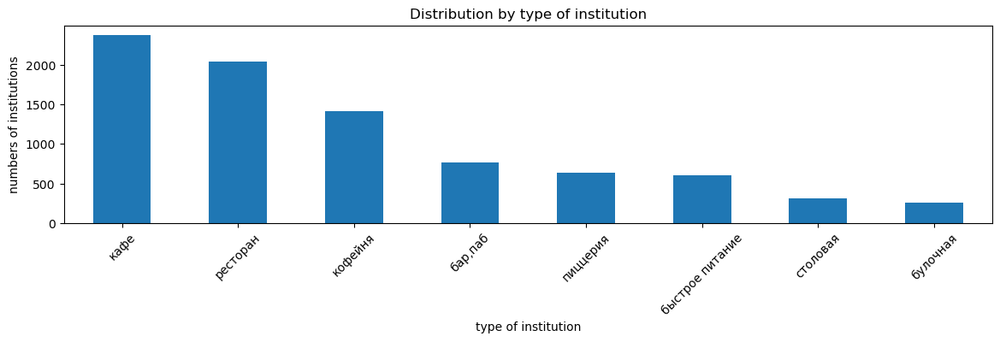

In [10]:
df['category'].value_counts().plot(kind='bar', figsize=(14,3))
plt.title('Distribution by type of institution')
plt.xlabel('type of institution')
plt.ylabel('numbers of institutions')
plt.xticks(rotation=45)
plt.show()

###
The dataset contains the following types of establishments (in descending order by number): <p> <p> - Cafe (2378), <p> - Restaurant (2043), <p> - Coffee house (1413), <p> - Bar/ Pub (765), <p> - Pizzeria (633), <p> - Fast food (603), <p> - Canteen (315), <p> - Bakery (256).

## Median and average number of seats by types of establishments

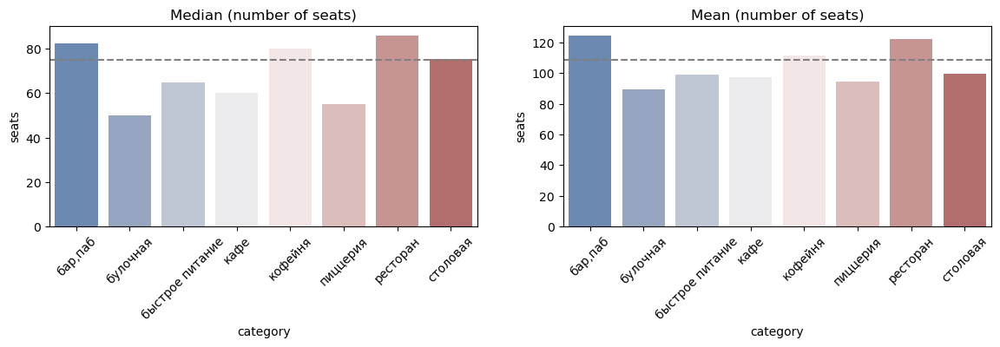

In [11]:
_ = df.groupby('category', as_index=False)['seats'].median()
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(14,3))
sns.barplot(x='category', y='seats', data=_, ax=axs[0], palette="vlag")
_ = df.groupby('category', as_index=False)['seats'].mean()
sns.barplot(x='category', y='seats', data=_, ax=axs[1], palette="vlag")
axs[0].set_title('Median (number of seats)')
axs[1].set_title('Mean (number of seats)')
axs[0].tick_params(axis='x', rotation=45)
axs[1].tick_params(axis='x', rotation=45)
axs[0].axhline(df.seats.median(), linestyle='--', color='gray')
axs[1].axhline(df.seats.mean(), linestyle='--', color='gray')
plt.show()

## Boxplot chart (seats by types of establishments)

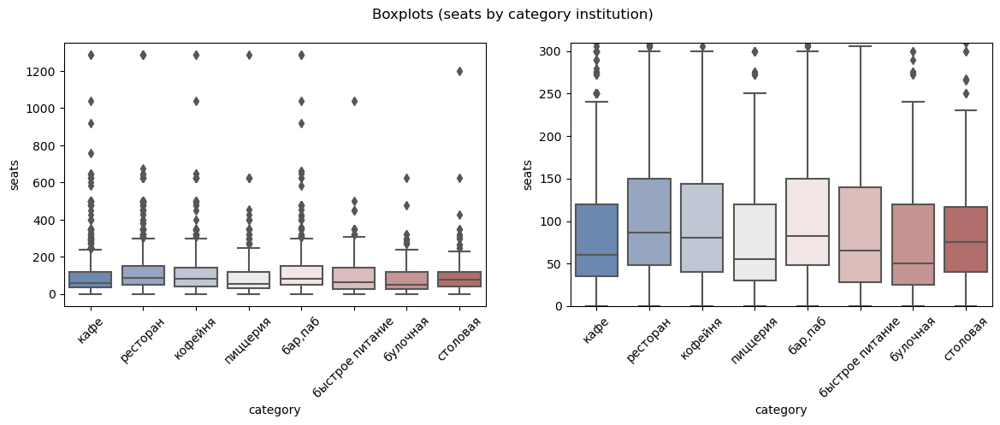

In [12]:
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(14,4))
sns.boxplot(data=df, x= df.category, y=df.seats, ax=axs[0], palette="vlag")
sns.boxplot(data=df, x= df.category, y=df.seats, ax=axs[1], palette="vlag")
fig.suptitle('Boxplots (seats by category institution)')
axs[1] = plt.ylim(0,310)
axs[0].tick_params(axis='x', rotation=45)
plt.xticks(rotation=45)
plt.show()

### In terms of the number of seats in the context of types of establishments, two groups of establishments <p><p> are viewed - the 1st group is a restaurant, coffee house, fast food, bar / pub - a typical value for this group is up to 300 seats ( median value from 75 to 90).<p> - 2nd group - canteen, bakery, pizzeria, cafe - seats up to 250 (with a median value from 55 to 70). Outliers strongly influence the average value (there are a number of establishments with more than 1000 seats).

## Ratio of chain and non-chain establishments.

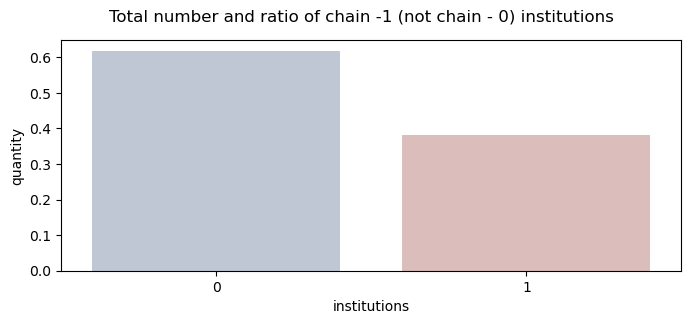

In [13]:
_ = df.groupby('chain', as_index=False)['name'].count()
_['ratio'] = _.name / _.name.sum()
fig, axs = plt.subplots(1, figsize=(8,3))
fig.suptitle('Total number and ratio of chain -1 (not chain - 0) institutions')
#sns.barplot(x=_.chain, y=_.name, data=_,  ax=axs[0], palette="vlag")
sns.barplot(x=_.chain, y=_.ratio, data=_,  palette="vlag")
axs.set_ylabel('quantity')
axs.set_xlabel('institutions')
plt.show()

### The dataset includes 5,000 non-chain establishments (share 0.6), 3,000 chain establishments (share 0.37)

## Total number and share among chain establishments

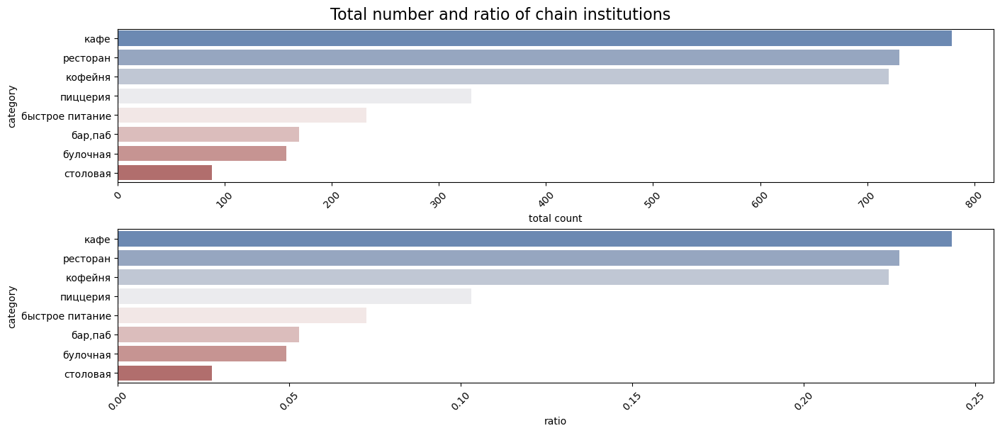

In [14]:
_ = df[df['chain'] == 1].groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False)
_['ratio'] = _.name / _.name.sum()
fig, axs = plt.subplots(2, 1, figsize=(14,6), constrained_layout = True)
fig.suptitle('Total number and ratio of chain institutions', fontsize=16)
sns.barplot(x=_.name, y=_.category, data=_, ax=axs[0], palette="vlag")
sns.barplot(x=_.ratio, y=_.category, data=_, ax=axs[1], palette="vlag")
axs[0].tick_params(axis='x', rotation=45)
plt.xticks(rotation=45)
axs[0].set_ylabel('category')
axs[0].set_xlabel('total count')
plt.show()

## The ratio of chain establishments to the total number

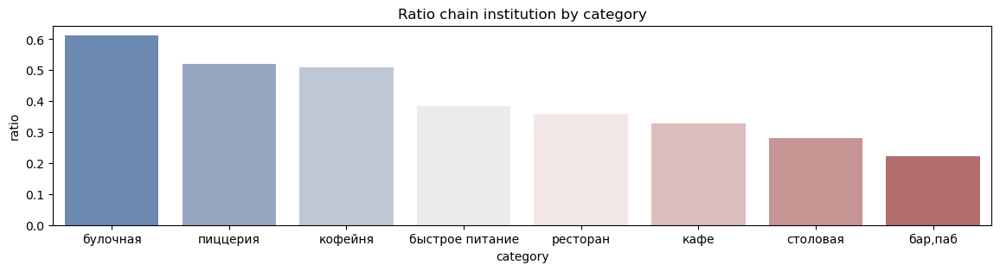

In [15]:
_ = pd.pivot_table(df, index='category', columns='chain', values='name', aggfunc='count')
_['sum_'] = _.iloc[:,0] + _.iloc[:,1]
_['ratio'] = _.iloc[:,1] / _['sum_']
_ =_.sort_values(by='ratio', ascending=False)
fig = plt.subplots(figsize=(14,3))
sns.barplot(x=list(_.index), y='ratio', data=_, palette="vlag")
plt.title('Ratio chain institution by category')
plt.xlabel('category')
plt.show()

### Among all establishments, they are more often chain ones - a bakery (share 0.6), a pizzeria (share 0.5), a coffee house (share 0.5)

## Top 15 popular establishments in Moscow.

In [16]:
_ = df[df['chain'] == 1].groupby(['name', 'category'], as_index=False)['address'].count().sort_values(by='address', ascending=False).head(15)
_

,name,category,address
1142,Шоколадница,кофейня,119
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
206,One Price Coffee,кофейня,71
1158,Яндекс Лавка,ресторан,69
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
978,Теремок,ресторан,36


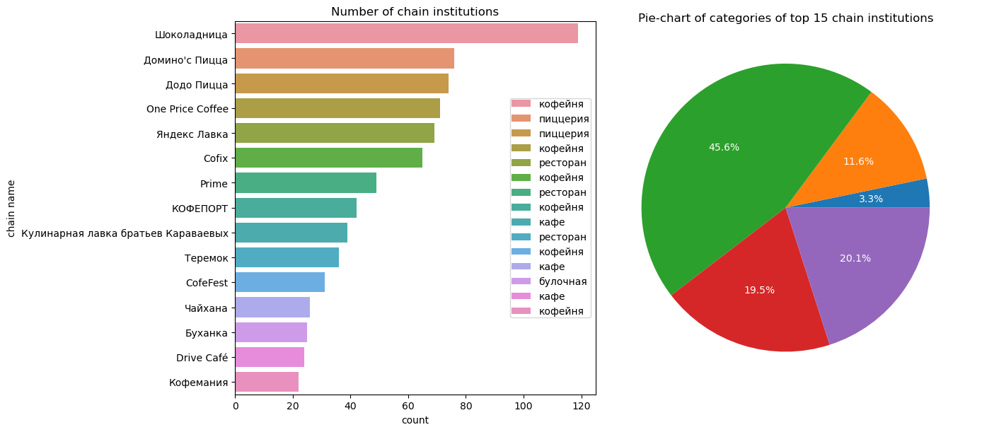

In [17]:
fig, axs = plt.subplots(1,2, figsize=(14,6), constrained_layout = True)
axs[0] = sns.barplot(x=_.address, y=_.name, data=_, label=(_.category), ax=axs[0])
axs[1] = plt.pie(x=_.groupby('category', as_index=False)['address']
                 .sum()['address'], labels=_.groupby('category', as_index=False)['address']
                 .sum()['category'], autopct='%1.1f%%', textprops={'color':"w"},
                 colors=sns.color_palette("tab10"))
axs[0].set_title('Number of chain institutions')
axs[0].set_xlabel('count')
axs[0].set_ylabel('chain name')
axs[0].legend(loc='right', borderpad=0.1)
plt.title('Pie-chart of categories of top 15 chain institutions')
plt.show()

### The leader in terms of the number of outlets in the region is the Shokoladnitsa cafe network - a little less than 120 outlets. Next are pizzerias Dominos, Dodo - a little less than 80 points. Of all the chains, I only know the Dominos pizzeria. If the task is supposed to draw a conclusion based on my personal experience, then I can’t do anything here, due to ignorance of the overwhelming number of networks presented. However, I will try to make a small analysis based on the graph above - In the number of presented networks in the context of categories, it can be seen that the largest share among the presented variety of networks is occupied by coffee houses (Approximately 45 percent). <p><p> In the top 15:<p>pizzerias - 2, <p>restaurants - 3, <p>bakery - 1, <p>coffee houses - 6, <p>cafes - 3.

## Total number of establishments and number of establishments in each category by district.

In [18]:
_ = df.groupby(['district', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
_

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


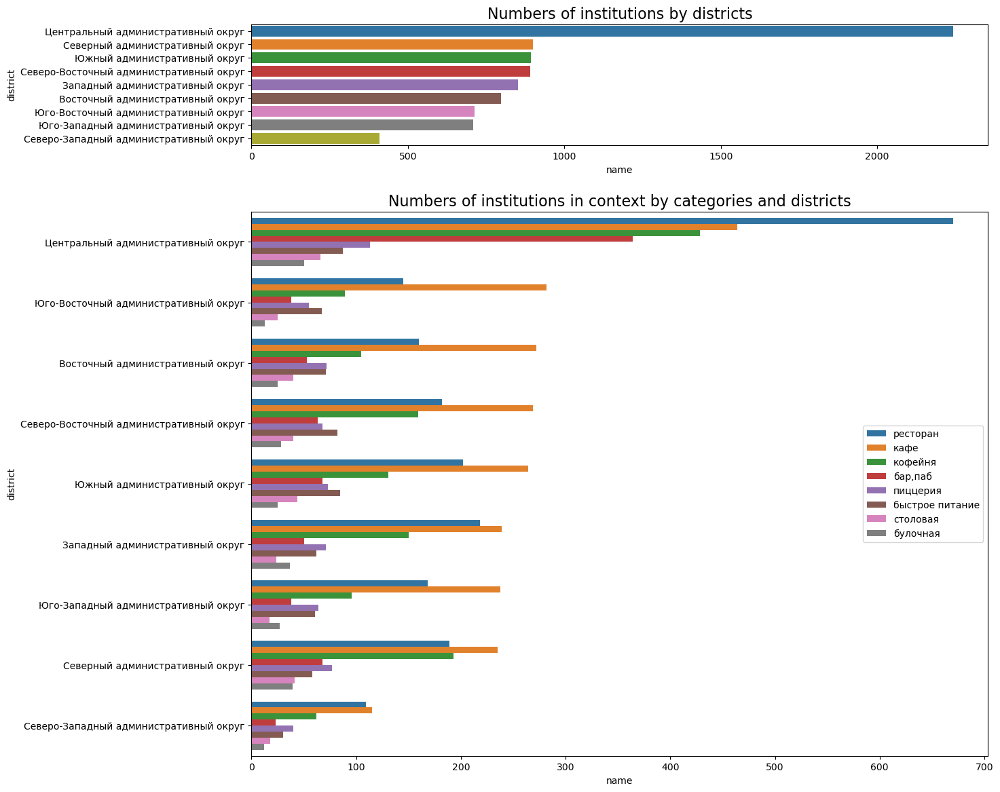

In [19]:
_ = df.groupby(['district', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
__ = df.groupby(['district'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
fig, axs = plt.subplots(2, 1, figsize=(14,14), gridspec_kw={'height_ratios': [1, 4.5]})
axs[0] = sns.barplot(y='district', x='name', data=__, ax=axs[0])
axs[1] = sns.barplot(y='district', x='name', data=_, hue='category', ax=axs[1])
axs[0].set_title('Numbers of institutions by districts', fontsize=16)
axs[1].set_title('Numbers of institutions in context by categories and districts', fontsize=16)
axs[1].legend(loc='right')
plt.show()

### The largest number of establishments is located in the Central Administrative District (more than 2,000 establishments), with restaurants dominating among types of establishments (about 670). The Northern, Southern and North-Eastern districts are very similar in terms of the total number of establishments (about 900 establishments for each). South-Eastern, Eastern, North-Eastern Southern, Western, South-Western and Northern districts have a common property in terms of the distribution of categories of establishments - in all of the above districts, the cafe is the leader in the number of establishments in terms of categories. Severo-Zapadny has the smallest number of establishments (less than 500), however, the distribution of categories here is similar to the distribution of the above districts.

## Distribution of average ratings by categories of establishments.

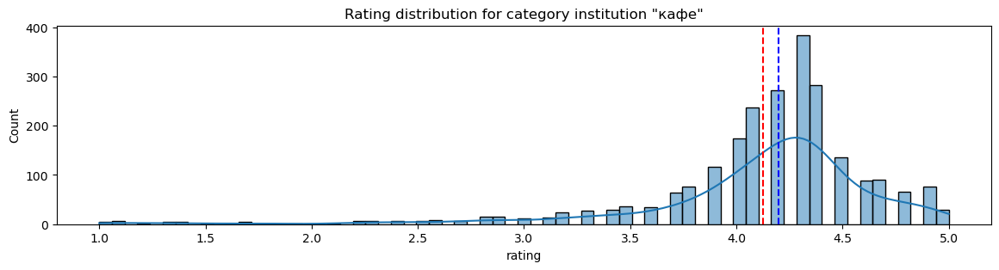

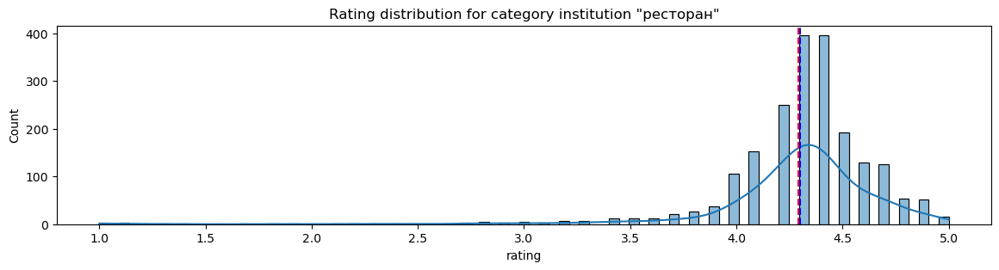

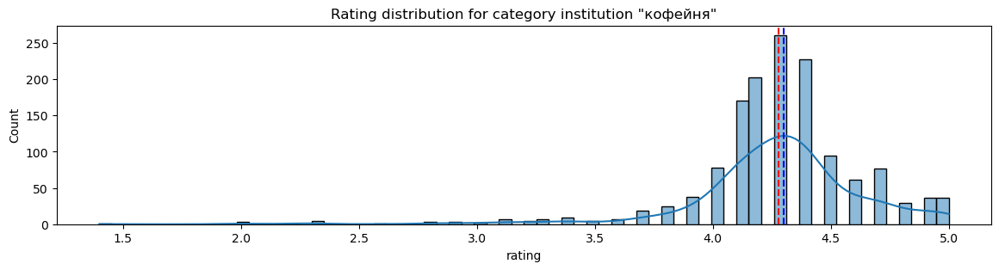

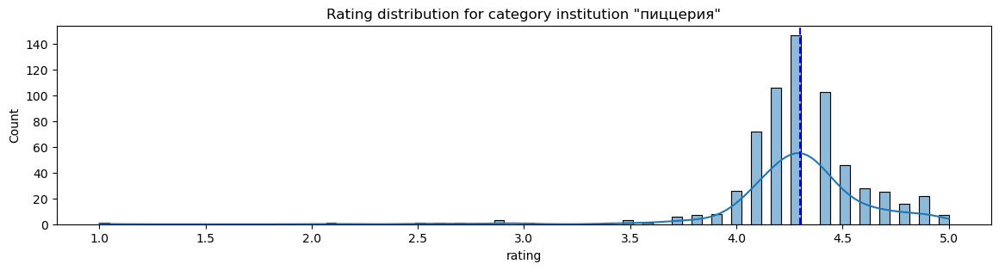

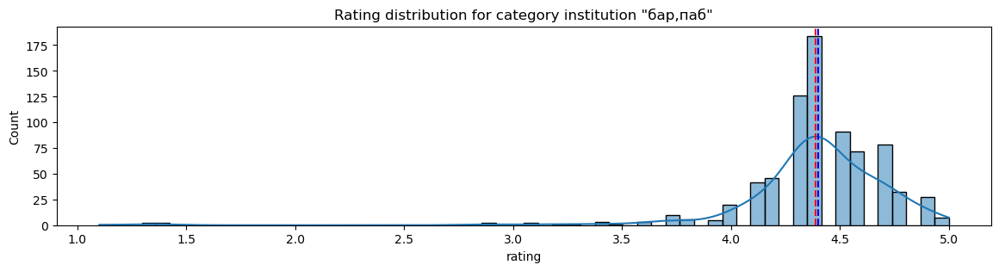

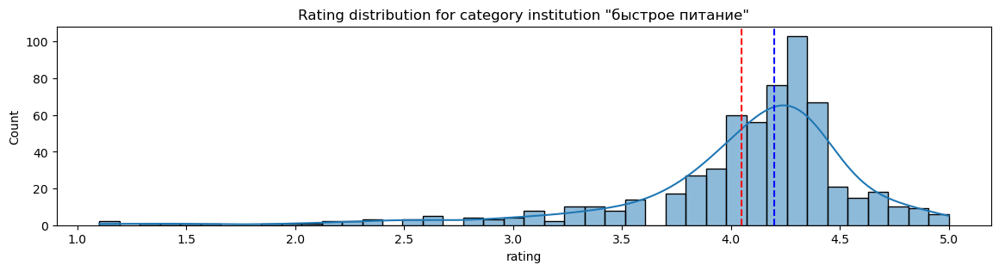

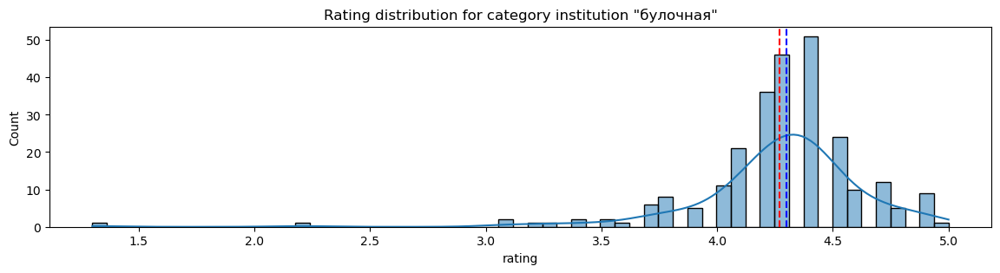

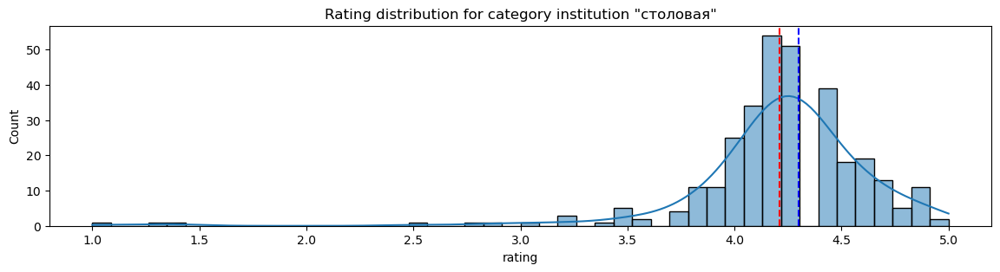

In [20]:
for i in df['category'].unique():
    _ = df[df['category'] == i]
    fig, axs = plt.subplots(figsize=(14,3))
    sns.histplot(_['rating'], kde=True)
    axs.set_title(f'Rating distribution for category institution "{i}"')
    axs.axvline(x=_.rating.mean(), color='red', ls='--')
    axs.axvline(x=_.rating.median(), color='b', ls='--')
    plt.show()

In [21]:
df.groupby('category')['rating'].agg(['count', 'mean', 'median'])

,count,mean,median
category,,,
"бар,паб",765,4.387712,4.4
булочная,256,4.268359,4.3
быстрое питание,603,4.050249,4.2
кафе,2378,4.123886,4.2
кофейня,1413,4.277282,4.3
пиццерия,633,4.301264,4.3
ресторан,2043,4.290357,4.3
столовая,315,4.211429,4.3


### The highest average ratings are typical for the category bar/pub (4.38), pizzeria (4.3), restaurant (4.21). The worst result for this indicator belongs to the fast food category. In general, the difference between the worst and the best is quite noticeable, perhaps this is due to the fact that visitors to fast food establishments make demands on these establishments as establishments where the requirements for the quality of service are much higher. However, according to the median indicator, it can be said that the rating does not differ significantly for different categories.

### A background cartogram showing the average rating of establishments in each district.

In [22]:
r = requests.get('https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson')

In [23]:
# load the JSON file with the borders of the districts of Moscow
df_rating_mean = df.groupby('district', as_index=False)['rating'].mean()
#state_geo = 'admin_level_geomap.geojson'
state_geo = r.json()
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# create a map of Moscow
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the Choropleth constructor and add it to the map
folium.Choropleth(
    geo_data=state_geo,
    data=df_rating_mean,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Average rating of establishments by district',
).add_to(m)
marker_cluster = folium.plugins.MarkerCluster().add_to(m)

# write a function that takes a dataframe string,
# creates a marker at the current point and adds it to the cluster marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# apply the create_clusters() function to each row of the dataframe
df.apply(create_clusters, axis=1)
# display the map
m

## Top 15 streets by number of establishments

In [24]:
__ = df.groupby(['street'], as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)

In [25]:
_ = df[df['street'].isin(__['street'])]
_ =_.groupby(['street', 'category'], as_index=False)['name'].count()

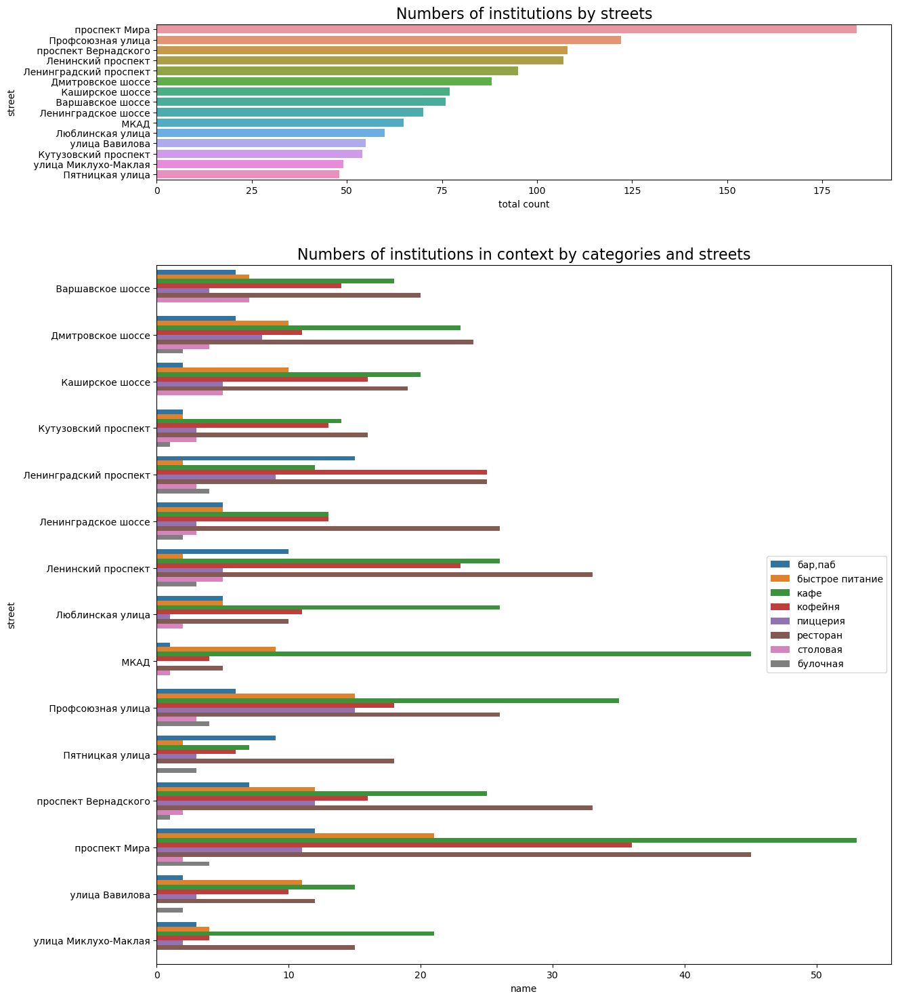

In [26]:
fig, axs = plt.subplots(2, 1, figsize=(14,18), gridspec_kw={'height_ratios': [1, 4.5]})
axs[0] = sns.barplot(y='street', x='name', data=__, ax=axs[0])
axs[1] = sns.barplot(y='street', x='name', data=_, hue='category', ax=axs[1])
axs[0].set_title('Numbers of institutions by streets', fontsize=16)
axs[1].set_title('Numbers of institutions in context by categories and streets', fontsize=16)
axs[1].legend(loc='right')
axs[0].set_xlabel('total count')
plt.show()

### In terms of the total number of food outlets, Mira Avenue is the leader by a wide margin - 184 establishments fall on this street. Profsoyuznaya Street ranks second in this indicator with an indicator of just under 124 food outlets. The dominance of cafes over other categories of establishments is observed: on the Moscow Ring Road (most pronounced - more than 45 points against the nearest category "restaurant" less than 10), Profsoyuznaya street, Prospekt Mira, st. Vavilov, st. Miklouho-McFly. "Restaurant" streets - Leningradskoye shosse, Vernadsky avenue, Leninsky avenue.

## Streets with only one catering facility.

In [27]:
df['count_inst'] = df['street'].apply(lambda x: len(df[df['street'] == x]))

In [28]:
streets_one_int = df[df['count_inst'] == 1]

### Here are the "technical" charts where I wanted to find some features. Will not be included in the final presentation.

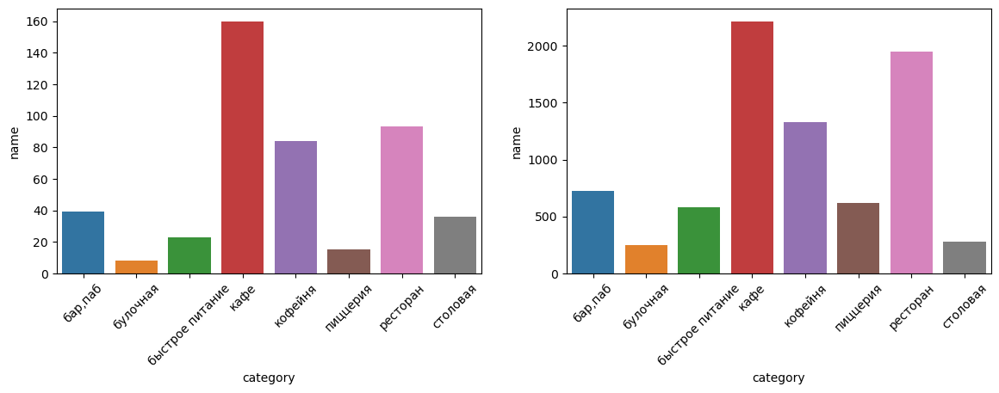

In [29]:
data = streets_one_int.groupby('category', as_index=False)['name'].count()
fig, axs = plt.subplots(1,2, figsize=(14,4))
sns.barplot(x='category', y='name', data=data, ax=axs[0])
data = df[df['count_inst'] > 1].groupby('category', as_index=False)['name'].count()
sns.barplot(x='category', y='name', data=data, ax=axs[1])
axs[0].tick_params(axis='x', rotation=45)
plt.xticks(rotation=45)
plt.show()

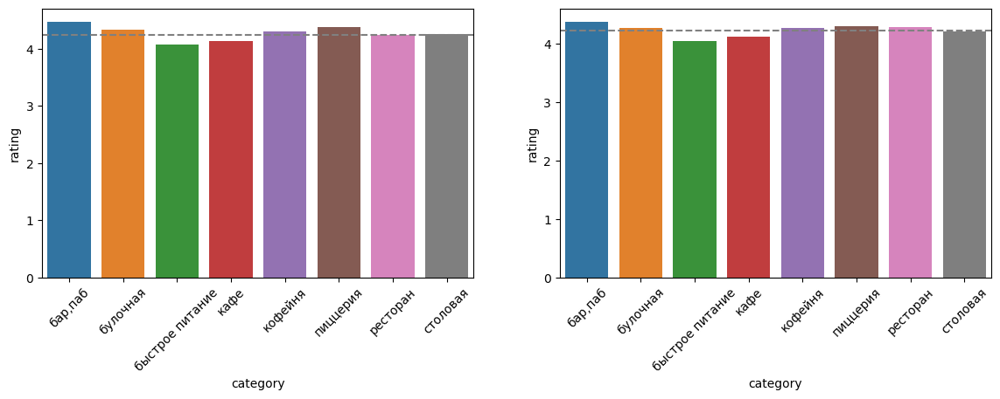

In [30]:
data = streets_one_int.groupby('category', as_index=False)['rating'].mean()
fig, axs = plt.subplots(1,2, figsize=(14,4))
sns.barplot(x='category', y='rating', data=data, ax=axs[0])
data = df[df['count_inst'] > 1].groupby('category', as_index=False)['rating'].mean()
sns.barplot(x='category', y='rating', data=data, ax=axs[1])
axs[0].tick_params(axis='x', rotation=45)
plt.xticks(rotation=45)
axs[0].axhline(streets_one_int.rating.mean(), linestyle='--', color='gray')
axs[1].axhline(df[df['count_inst'] > 1].rating.mean(), linestyle='--', color='gray')
plt.show()

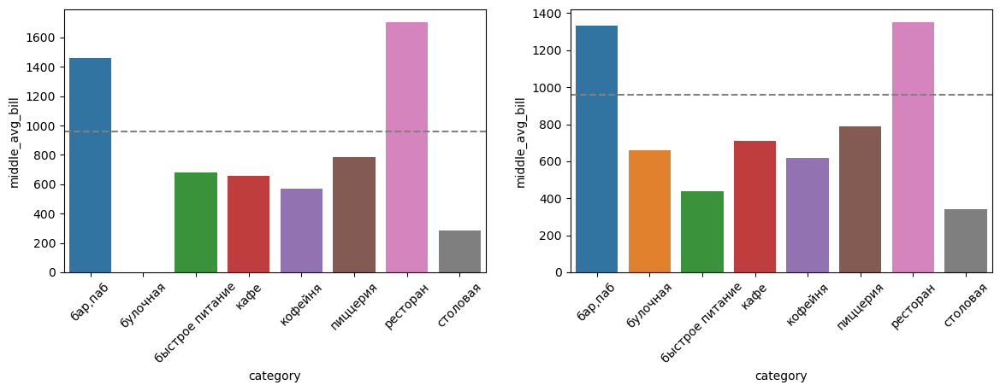

In [31]:
data = streets_one_int.groupby('category', as_index=False)['middle_avg_bill'].mean() 
fig, axs = plt.subplots(1,2, figsize=(14,4))
sns.barplot(x='category', y='middle_avg_bill', data=data, ax=axs[0])
data = df[df['count_inst'] > 1].groupby('category', as_index=False)['middle_avg_bill'].mean()
sns.barplot(x='category', y='middle_avg_bill', data=data, ax=axs[1])
axs[0].tick_params(axis='x', rotation=45)
plt.xticks(rotation=45)
axs[0].axhline(streets_one_int.middle_avg_bill.mean(), linestyle='--', color='gray')
axs[1].axhline(df[df['count_inst'] > 1].middle_avg_bill.mean(), linestyle='--', color='gray')
plt.show()

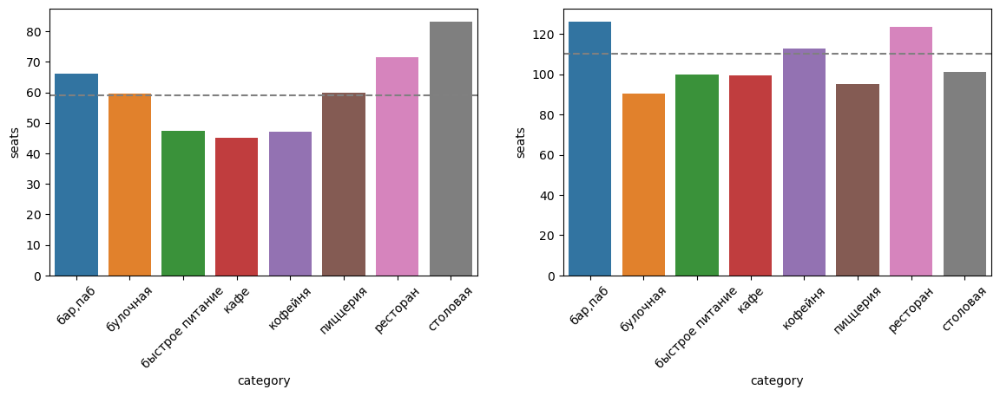

In [32]:
data = streets_one_int.groupby('category', as_index=False)['seats'].mean()
fig, axs = plt.subplots(1,2, figsize=(14,4))
sns.barplot(x='category', y='seats', data=data, ax=axs[0])
data = df[df['count_inst'] > 1].groupby('category', as_index=False)['seats'].mean()
sns.barplot(x='category', y='seats', data=data, ax=axs[1])
axs[0].tick_params(axis='x', rotation=45)
plt.xticks(rotation=45)
axs[0].axhline(streets_one_int.seats.mean(), linestyle='--', color='gray')
axs[1].axhline(df[df['count_inst'] > 1].seats.mean(), linestyle='--', color='gray')
plt.show()

### For institutions that do not have competitors on the street where they are located, a smaller number of seats is typical.

In [33]:
districts_grouped_by_mab = df.groupby('district', as_index=False)['middle_avg_bill'].median()
districts_grouped_by_mab

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


## Background cartogram with the obtained values of average checks for each district

In [34]:
state_geo = r.json()
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the Choropleth constructor and add it to the map
folium.Choropleth(
    geo_data=state_geo,
    data=districts_grouped_by_mab,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Average check',
).add_to(m)
marker_cluster = MarkerCluster().add_to(m)

# write a function that takes a dataframe string,
# creates a marker at the current point and adds it to the cluster marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# apply the create_clusters() function to each row of the dataframe
df.apply(create_clusters, axis=1)
# display the map
m

In [35]:
#function for calculating distance by coordinates
def mileage(row):
    coords_1 = (55.751244, 37.618423) #center of Moscow
    coords_2 = (row['lat'], row['lng'])
    distance = h3.point_dist(coords_1, coords_2, unit='km')
    return round(distance,2)

### As expected, the most expensive is the Central District, and unexpectedly the Western. The cheapest are South and Southeast.

In [37]:
df['milage_up_to_center'] = round(df.apply(mileage, axis=1))

In [38]:
__ = (df.groupby(['milage_up_to_center', 'category'],
                 as_index=False)['middle_avg_bill'].mean().dropna())

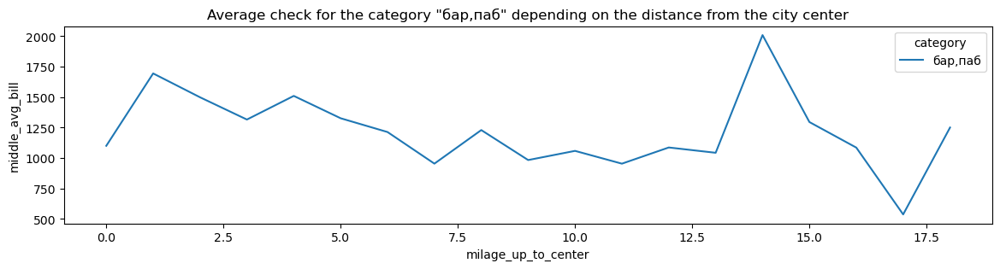

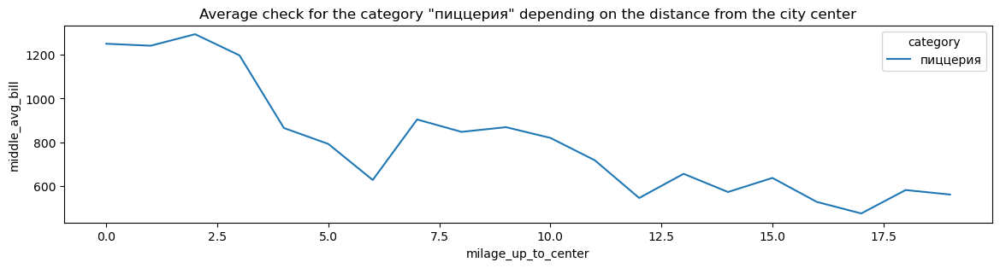

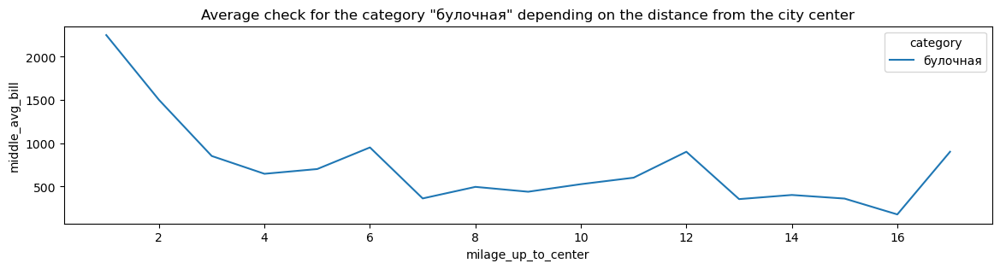

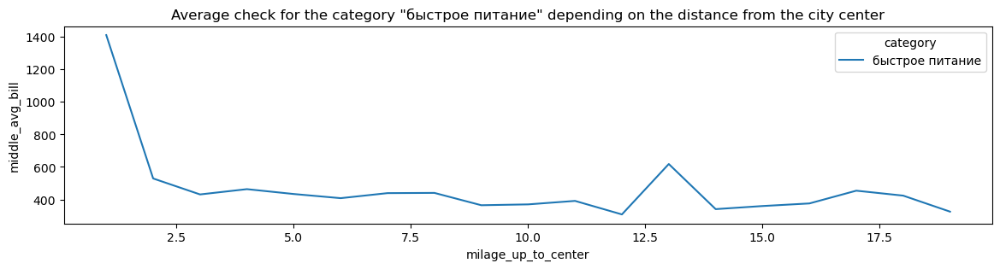

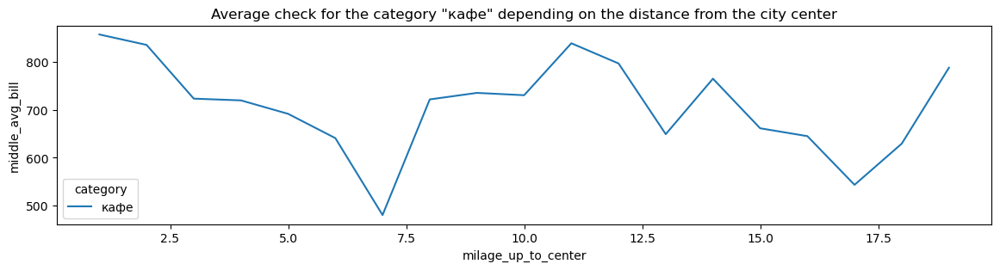

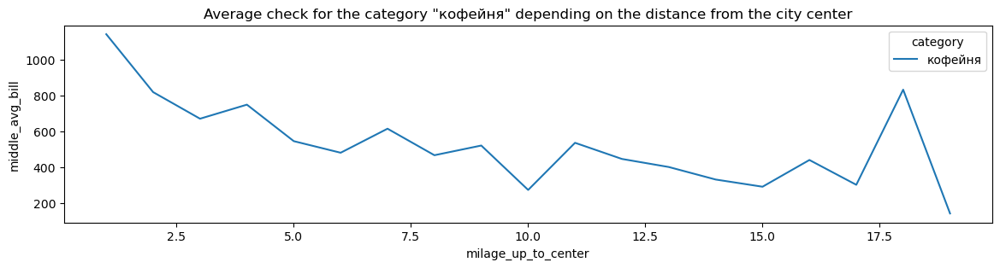

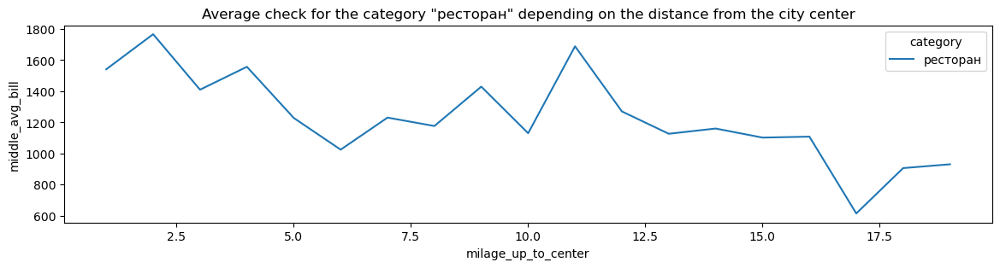

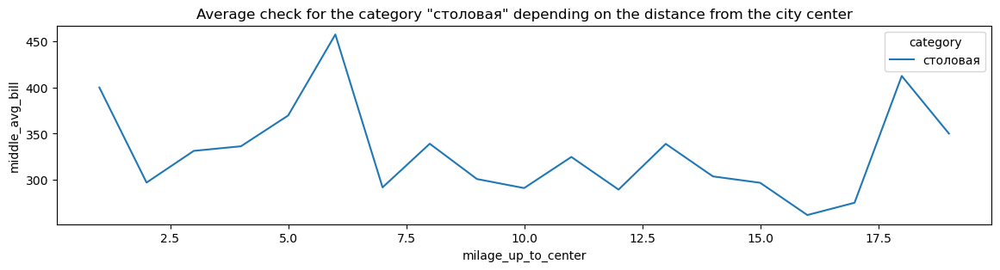

In [39]:
for i in __['category'].unique():
    fig, axs = plt.subplots(1, figsize=(14,3))
    sns.lineplot(x='milage_up_to_center', y='middle_avg_bill', data=__[__['category'] == i], hue='category')
    plt.title(f'Average check for the category "{i}" depending on the distance from the city center')
    plt.show()

### Based on the charts above, it turns out that the rule does not always work - the farther from the center, the lower the cost, there are individual establishments located at a respectful distance from the city center, but the average bill in such establishments may be higher than in the center . And if you want to eat on a budget, then go to the bakery with the coordinates 55.74357, 37.866127. But it's better to go to the dining room with coordinates 55.611558, 37.618040, perhaps there will be cutlets with puree.

In [40]:
np.percentile(df['rating'], 25)

4.1

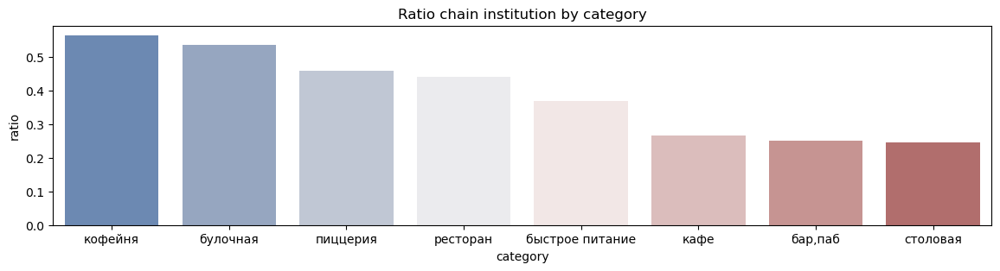

In [41]:
_ = pd.pivot_table(df[df['rating'] < 4.1], index='category', columns='chain', values='name', aggfunc='count')
_['sum_'] = _.iloc[:,0] + _.iloc[:,1]
_['ratio'] = _.iloc[:,1] / _['sum_']
_ =_.sort_values(by='ratio', ascending=False)
fig = plt.subplots(figsize=(14,3))
sns.barplot(x=list(_.index), y='ratio', data=_, palette="vlag")
plt.title('Ratio chain institution by category')
plt.xlabel('category')
plt.show()